# Bike sharing dataset 
This dataset is about the bike-rental programme's weather and seasonal information. Bike rentals are becoming of great interest because of their prevalence and their impact on health, traffic and environment. This dataset is compiled from a two-year historical log corresponding to years 2011 and 2012 from Capital Bikeshare system, Washington D.C, which has a public website for the [data](http://capitalbikeshare.com/system-data).

## Problem
> Prediction of bike rental count hourly or daily based on the environmental and seasonal settings.


## Dataset availability
The dataset is available publicly at the [UC Irvine ML repository](https://archive-beta.ics.uci.edu/dataset/275/bike+sharing+dataset). The dataset consists of hourly and daily bike sharing counts. Files of the datasets are:
- `hour.csv` : bike sharing counts aggregated on hourly basis. Records: 17379 hours
- `day.csv` - bike sharing counts aggregated on daily basis. Records: 731 days

## Interpretation of the variables 
Both hour.csv and day.csv have the following fields, except hr which is not available in day.csv

- `instant`: record index
- `dteday` : date
- `season` : season (1:spring , 2:summer, 3:fall, 4:winter)
- `yr` : year (0: 2011, 1:2012)
- `mnth` : month ( 1 to 12)
- `hr` : hour (0 to 23)
- `holiday` : weather day is holiday or not (extracted from http://dchr.dc.gov/page/holiday-schedule)
- `weekday` : day of the week
- `workingday` : if day is neither weekend nor holiday is 1, otherwise is 0.
+ `weathersit` : 
    - 1: Clear, Few clouds, Partly cloudy, Partly cloudy
    - 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist
    - 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds
    - 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog
- `temp` : Normalized temperature in Celsius. The values are divided to 41 (max)
- `atemp`: Normalized feeling temperature in Celsius. The values are divided to 50 (max)
- `hum`: Normalized humidity. The values are divided to 100 (max)
- `windspeed`: Normalized wind speed. The values are divided to 67 (max)
- `casual`: count of casual users
- `registered`: count of registered users
- `cnt`: count of total rental bikes including both casual and registered



## Profiling


In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport

df_day_data = pd.read_csv("assets/bike+sharing+dataset/day.csv", index_col='instant')
df_day_data['dteday'] = pd.to_datetime(df_day_data['dteday'])
df_day_data = df_day_data.astype({
    'holiday': 'bool',
    'workingday': 'bool',
    'season': 'category',
    # 'weekday': 'category',
})
df_day_data.dtypes

/tmp/ipykernel_597596/1673822156.py:5: DeprecationWarning: 
    `import ydata_profiling` is deprecated and will not receive more updates. 
    Please install fg-data-profiling via `pip install fg-data-profiling` and use `import data_profiling` instead.
    
  from ydata_profiling import ProfileReport


dteday        datetime64[ns]
season              category
yr                     int64
mnth                   int64
holiday                 bool
weekday                int64
workingday              bool
weathersit             int64
temp                 float64
atemp                float64
hum                  float64
windspeed            float64
casual                 int64
registered             int64
cnt                    int64
dtype: object

In [2]:
df_day_data.head()

,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
instant,,,,,,,,,,,,,,,
1,2011-01-01,1,0,1,False,6,False,2,0.344167,0.363625,0.805833,0.160446,331,654,985
2,2011-01-02,1,0,1,False,0,False,2,0.363478,0.353739,0.696087,0.248539,131,670,801
3,2011-01-03,1,0,1,False,1,True,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349
4,2011-01-04,1,0,1,False,2,True,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562
5,2011-01-05,1,0,1,False,3,True,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600


In [3]:
# Let's run the timeseries mode

# removed year and month because it's already in the `dteday`
dev_df = df_day_data.drop(columns=['yr', 'mnth']) 
type_shema={'temp':'timeseries', 'atemp':'timeseries', 'hum':'timeseries', 'windspeed':'timeseries',
             }
profile = ProfileReport(dev_df ,tsmode=True,sortby='dteday',type_schema=type_shema ,title="Bike Rental Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 13/13 [00:00<00:00, 80.83it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Overall, as seen from overview tab, we've 13 variables and 731 observations. Noteworthy observations:
- `temp` and `atemp` variables seem to be largely following similar pattern.
- `casual` users have much higher variance than `registered` and `cnt` (actual bike renters) users have similar pattern but scale is quite different. 
- In the interactions tab, we see that `registered` and `cnt` relationship follows an interesting pattern: the `cnt` seems to above a line given by `registered` count.
- `temperature` and `cnt` seem to have positive correlation but the noise seem to be very big.
- In the timeseries tab, for the main variable of interest `cnt`, the seasonal pattern shows. There seem to be stark decline of bike rentals during winter. But for the company, they've got much more rentals in the second year than the first year. This trend largely the same for the `temp` variable.
- From the correlation matrix, aside from obvious ones (like atemp and temp, registered and cnt), the correlations of interest are between `casual` and `temp`, `registered` and `casual`.

## Exploratory Data Analysis: `day.csv`
Let's start with the dataset with `daily` records.

In [4]:
from lets_plot import *

LetsPlot.setup_html()
df_day_data.head()

,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
instant,,,,,,,,,,,,,,,
1,2011-01-01,1,0,1,False,6,False,2,0.344167,0.363625,0.805833,0.160446,331,654,985
2,2011-01-02,1,0,1,False,0,False,2,0.363478,0.353739,0.696087,0.248539,131,670,801
3,2011-01-03,1,0,1,False,1,True,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349
4,2011-01-04,1,0,1,False,2,True,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562
5,2011-01-05,1,0,1,False,3,True,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600


### Data cleaning: Is there a missing data?
In `pandas`, the `isna` method shows is the element is `NA` (Not Available or `None` object.).

In [5]:
df_day_data.isna().sum()

dteday        0
season        0
yr            0
mnth          0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

Great! There is no missing data. Now I want to plot relationship between season and the counts of bikes rented.
### Relationship between variables of interest

In [6]:
(ggplot(df_day_data, aes(x=as_discrete('season'), y='cnt', fill=as_discrete('season'))) 
 + geom_boxplot() 
 + scale_x_discrete(labels=['spring', 'summer', 'fall', 'winter']) 
#  + scale_fill_manual(values=['cyan', 'green', 'yellow', 'white'])  # Order matches levels 1, 2, 3, 4
 + labs(title='Bike Rentals by Season', 
        x='Season', 
        y='Total Count', 
        fill='Season')
)

We see that in the `fall` season, on average, the number of people taking the rental bikes is largest whereas in the `spring`, it is least. Now, I wonder, what is the span of the dataset's days?

In [7]:
# Convert to datetime and find the span
dates = df_day_data['dteday']
print(f"Dataset starts on: {dates.min()}")
print(f"Dataset ends on:   {dates.max()}")
print(f"Total span:        {dates.max() - dates.min()}")

Dataset starts on: 2011-01-01 00:00:00
Dataset ends on:   2012-12-31 00:00:00
Total span:        730 days 00:00:00


OK, the dataset spans just about 2 years. Next, I wonder if there is any effect of cold and windy days on the number of people renting a bike. My hypothesis is that the numbers would decline during windy and cold days wouldn't because if I were cold, I would just go by a bus. To do that, let's plot the effect of `windspeed` on the `cnt` variable:

In [8]:
(ggplot(df_day_data, aes(x='windspeed', y='cnt')) 
 + geom_point(color='steelblue', size=2, alpha=0.6) 
 + geom_smooth(method='loess', color='red', size=1)
 + labs(title='Daily Bike Rentals vs. Wind Speed', 
        x='Normalized Wind Speed', 
        y='Total Daily Rentals')
)

The trend line is showing a downward slope, but I see roughly a uniform/Gaussian distribution of data points. There seem to be less of a correlation. Less than `0.3`, the `windspeed` seems to have no real effect. But above that, the number of values (observations) becomes sparse but only there seems to be the downward trend. Let's incorporate temperature information to this plot. Let's plot the relationship between temperature and the wind speed.

In [9]:
(ggplot(df_day_data, aes(x='temp', y='windspeed', color='cnt', size='cnt')) 
 + geom_point(alpha=0.6) 
 + scale_color_gradient(low='#deebf7', high='#08306b')
 + scale_size(range=[1, 10]) # Adjusts the minimum and maximum radius of the points
 + labs(title='Impact of Temp and Wind on Rentals', 
        subtitle='Size and color represent total rental count',
        x='Normalized Temperature', 
        y='Normalized Wind Speed', 
        color='Rentals',
        size='Rentals')
 + theme_minimal()
)

Aha! Now I see the sweet spot! The main cluster on the graph above shows that for low wind speeds and relatively warm temperature, the customers tend to rent a bike more. 

Let's investigate the effect of holidays. *Specifically, does holidays have generally low bike rentals compared to non-holiday days*?

 First let's see the value ranges of holiday to confirm it's binary and count the values.

In [10]:
df_day_data['holiday'].value_counts()

holiday
False    710
True      21
Name: count, dtype: int64

Ok, we've got 21 holidays recorded. That's quite a bummer because the holiday and non holidays are quite *imbalanced*.

In order to investigate the effect of holiday on `cnt` variable, let's see the average number of count of rentals (`cnt`) is there for holiday and non-holiday days.

In [11]:
holidays = df_day_data['holiday'] == 1
holiday_cnt = df_day_data[holidays]['cnt']
holiday_cnt.mean()

np.float64(3735.0)

In [12]:
non_holidays = df_day_data['holiday'] == 0
non_holiday_cnt = df_day_data[non_holidays]['cnt']
non_holiday_cnt.mean()

np.float64(4527.104225352113)

The means are, expectedly, quite different (`holiday` is much less than `non-holiday`). Now let's see the distribution of each of the rental counts (`cnt`s). 

cnt    Axes(0.125,0.11;0.775x0.77)
dtype: object

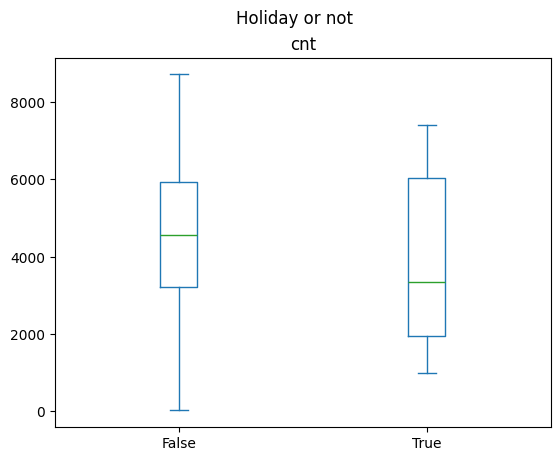

In [13]:
df_day_data[['holiday', 'cnt']].plot.box(by='holiday', title='Holiday or not')

In [14]:
from scipy.stats import ttest_ind

stat, p = ttest_ind(holiday_cnt, non_holiday_cnt, equal_var=False)

print(stat, p)

-1.704685615800036 0.10299984047957059


The plot shows that the indeed during holiday, people tend to use less bikes. However, the non-holidays show less variance than holiday samples, but it's due to the imbalance in the dataset. There really is much less holidays in 2 years than regular days. Hypothesis testing shows that with the usual `p-value` threshold of `0.05`, we cannot reject the null hypothesis of two set of data coming from a same distribution. 

## EDA: Hourly data

Now, let's investigate the `hour.csv` dataset. It contains a new column `hr` which makes the dataset suitable for investingating questions like:
- *During which hours people typically rent a bike the most? And which hours the least?*
- *The pattern of daily hours, how does it look like?*


In [15]:
df_hour_data = pd.read_csv("assets/bike+sharing+dataset/hour.csv", index_col='instant')
df_hour_data['dteday'] = pd.to_datetime(df_hour_data['dteday'])
df_hour_data = df_hour_data.astype({
    'holiday': 'bool',
    'workingday': 'bool',
    'season': 'category',
    # 'weekday': 'category',
})
print(f"Hourly data records and variables: {df_hour_data.shape}")
df_hour_data.head()

Hourly data records and variables: (17379, 16)


,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
instant,,,,,,,,,,,,,,,,
1,2011-01-01,1,0,1,0,False,6,False,1,0.24,0.2879,0.81,0.0,3,13,16
2,2011-01-01,1,0,1,1,False,6,False,1,0.22,0.2727,0.80,0.0,8,32,40
3,2011-01-01,1,0,1,2,False,6,False,1,0.22,0.2727,0.80,0.0,5,27,32
4,2011-01-01,1,0,1,3,False,6,False,1,0.24,0.2879,0.75,0.0,3,10,13
5,2011-01-01,1,0,1,4,False,6,False,1,0.24,0.2879,0.75,0.0,0,1,1


In [16]:
# Let's check if the first day, all hours average is given by the same record in the df_day_data file
import datetime
first_day = datetime.datetime(2011, 1, 1)
df_first_day = df_hour_data[df_hour_data['dteday'] == first_day]
df_first_day.head()

,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
instant,,,,,,,,,,,,,,,,
1,2011-01-01,1,0,1,0,False,6,False,1,0.24,0.2879,0.81,0.0,3,13,16
2,2011-01-01,1,0,1,1,False,6,False,1,0.22,0.2727,0.80,0.0,8,32,40
3,2011-01-01,1,0,1,2,False,6,False,1,0.22,0.2727,0.80,0.0,5,27,32
4,2011-01-01,1,0,1,3,False,6,False,1,0.24,0.2879,0.75,0.0,3,10,13
5,2011-01-01,1,0,1,4,False,6,False,1,0.24,0.2879,0.75,0.0,0,1,1


For this one day, let's calculate the average of the numerical columns.

In [17]:
numerical_cols = ["windspeed", "hum", "atemp", "temp"]
cumulative_cols = ["cnt", "registered", "casual"]
print(f"means of numerical cols: \n{df_first_day[numerical_cols].mean()}")
print(f"means of cumulative cols: \n{df_first_day[cumulative_cols].sum()}")


means of numerical cols: 
windspeed    0.160446
hum          0.805833
atemp        0.363625
temp         0.344167
dtype: float64
means of cumulative cols: 
cnt           985
registered    654
casual        331
dtype: int64


In [18]:
# Check above output against the `day.csv`
df_day_data[df_day_data["dteday"] == first_day][numerical_cols + cumulative_cols]

,windspeed,hum,atemp,temp,cnt,registered,casual
instant,,,,,,,
1,0.160446,0.805833,0.363625,0.344167,985,654,331


The values checks out. Not let's plot the `cnt` for this first day to see the pattern of hourly bike rental rate. 

<Axes: title={'center': 'Hourly bike rental rate for 2011-01-01 weekday 6'}, xlabel='hr'>

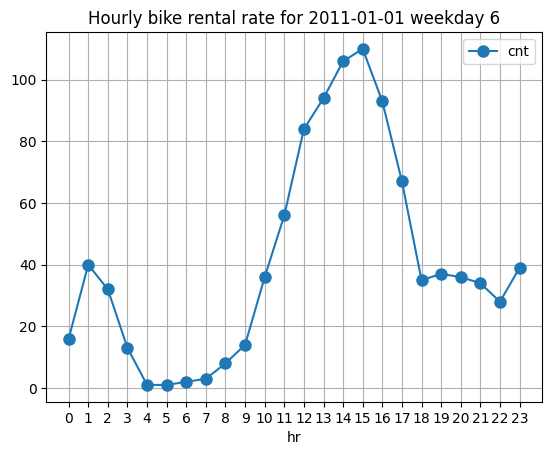

In [19]:
df_first_day.sort_values('hr').plot(
    x='hr',
    y='cnt',
    kind='line',
    marker='o',
    markersize=8,
    linewidth=1.5,
    title=f'Hourly bike rental rate for {first_day.date()} weekday {first_day.isoweekday()}',
    xticks=np.arange(0, 24, step=1),
    grid=True
)

The peak demand (at least for the first day), seems to be from `12` to `16` with sharp decline up until `18` o'clock. It's interesting that during the middle of a day, peak demand has occured. My initial guess was we would 2 peak hours one in the morning and the other after work. Perhaps due to this `first_day` was 6th day of the week, it is quite different. Let's see another date from the weekday.

<Axes: title={'center': 'Hourly bike rental rate for 2011-08-04 weekday 4'}, xlabel='hr'>

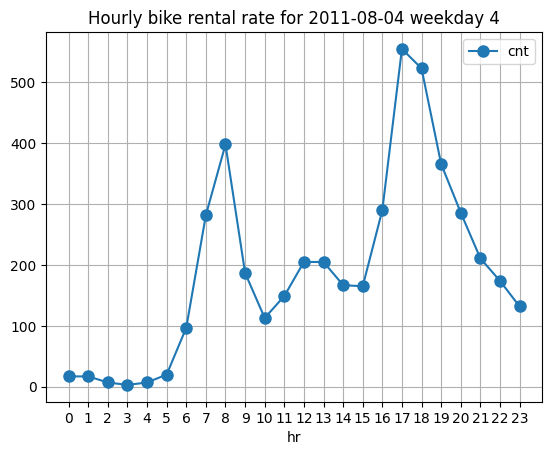

In [20]:
random_day = datetime.datetime(2011, 8, 4)
df_random_day = df_hour_data[df_hour_data['dteday'] == random_day]
df_random_day.sort_values('hr').plot(
    x='hr',
    y='cnt',
    kind='line',
    marker='o',
    markersize=8,
    linewidth=1.5,
    title=f'Hourly bike rental rate for {random_day.date()} weekday {random_day.isoweekday()}',
    xticks=np.arange(0, 24, step=1),
    grid=True
)

Yes, it's quite interesting that this morning (before work) and afternoon (after work) pattern is seen in a date 2011-08-04 which was Thursday. Now the question is, *does this pattern hold for every other workday and does previous weekend profile hold also for other weekends as well?*

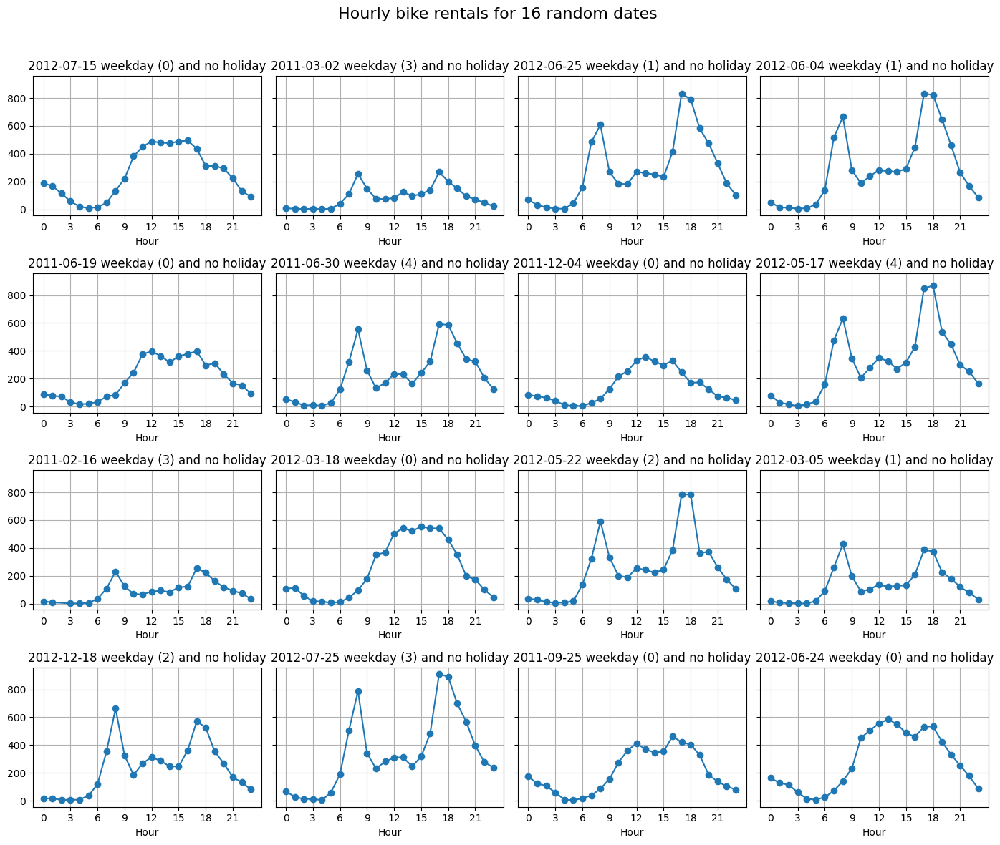

In [21]:
# Plot 16 random dates' hourly profiles in a 4x4 grid
np.random.seed(42)
df_weekdays = df_hour_data[~df_hour_data['weekday'].isin([5, 6])]
# need for unique because the dteday is same for every hour of a day.

def plot_random_days(df):
    """
    df: a df_hour_data or subset of it.
    """
    unique_days = df['dteday'].dt.date
    sample_days = np.random.choice(unique_days, size=16, replace=False)

    fig, axes = plt.subplots(4, 4, figsize=(14, 12), sharey=True)
    axes = axes.flatten()

    for ax, day in zip(axes, sample_days):
        day_df = df[df['dteday'].dt.date == day].sort_values('hr')
        ax.plot(day_df['hr'], day_df['cnt'], marker='o', linewidth=1.5)
        # print(day_df['holiday'].all() )
        # print(day_df['weekday'].isin([6, 7]).all())
        weekday = day_df['weekday'].iloc[0]
        ax.set_title(f"{day} {f"weekend ({weekday})" if weekday in ([5, 6]) else f"weekday ({weekday})"} and {"holiday" if day_df['holiday'].all() == True else "no holiday"}")
        ax.set_xlabel('Hour')
        ax.set_xticks(range(0, 24, 3))
        ax.grid(True)

    fig.suptitle('Hourly bike rentals for 16 random dates', fontsize=16)
    fig.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

plot_random_days(df_weekdays)


So, unfortunately, all of our 16 samples were `weekdays`. But most of the days show the abeforementioned two peaked hourly rate.

But let's get 16 samples from the weekends and plot.

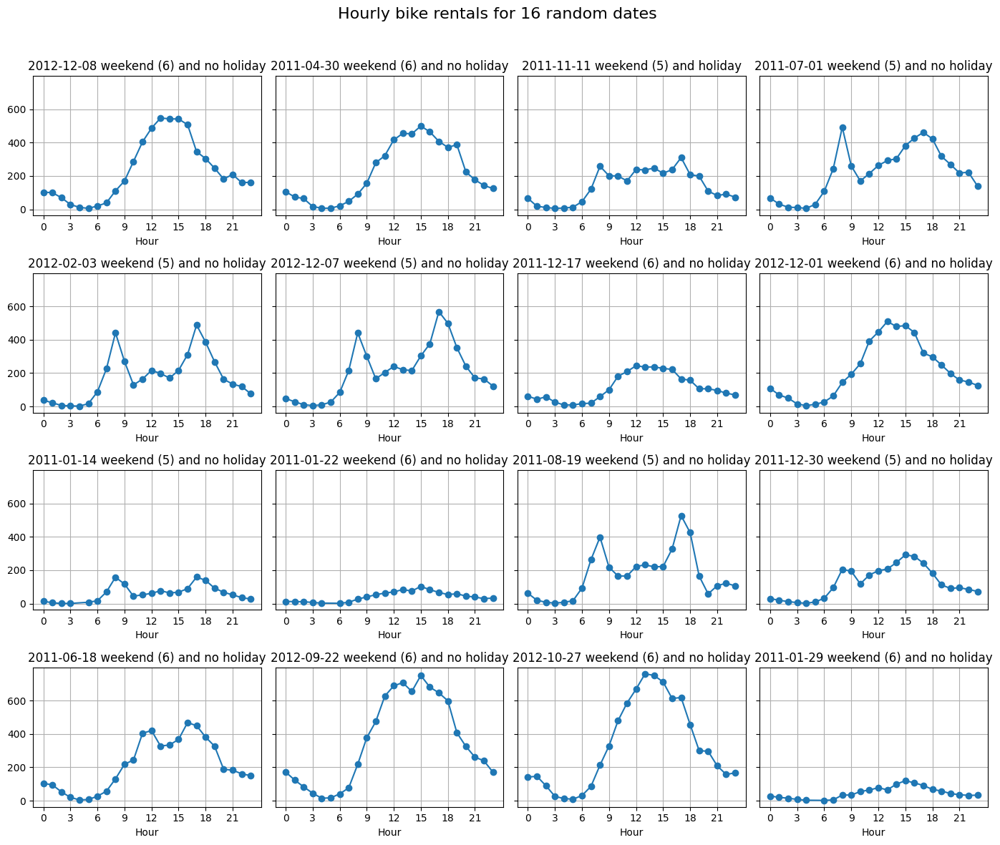

In [22]:
# np.random.seed(42)


# unique_days = df_hour_data['dteday'].dt.date.unique()
df_weekends = df_hour_data[df_hour_data['weekday'].isin([5, 6])]


plot_random_days(df_weekends)

There still seem to be quite a few of 2 peaked hourly rate even among `weekends`. 

In [23]:
datetime.datetime(2026, 5, 24).weekday()

6

So, Sunday is `6` in Python `datetime`. Let's check the `values_count` of `weekday`.

In [24]:
df_day_data['weekday'].value_counts().sort_index()

weekday
0    105
1    105
2    104
3    104
4    104
5    104
6    105
Name: count, dtype: int64

Now, let's see the random 16 plots for the `holidays`. I guess the numbers would be very low. Since we only have 21 holiday days in our dataset we're visualizing more than half of them.

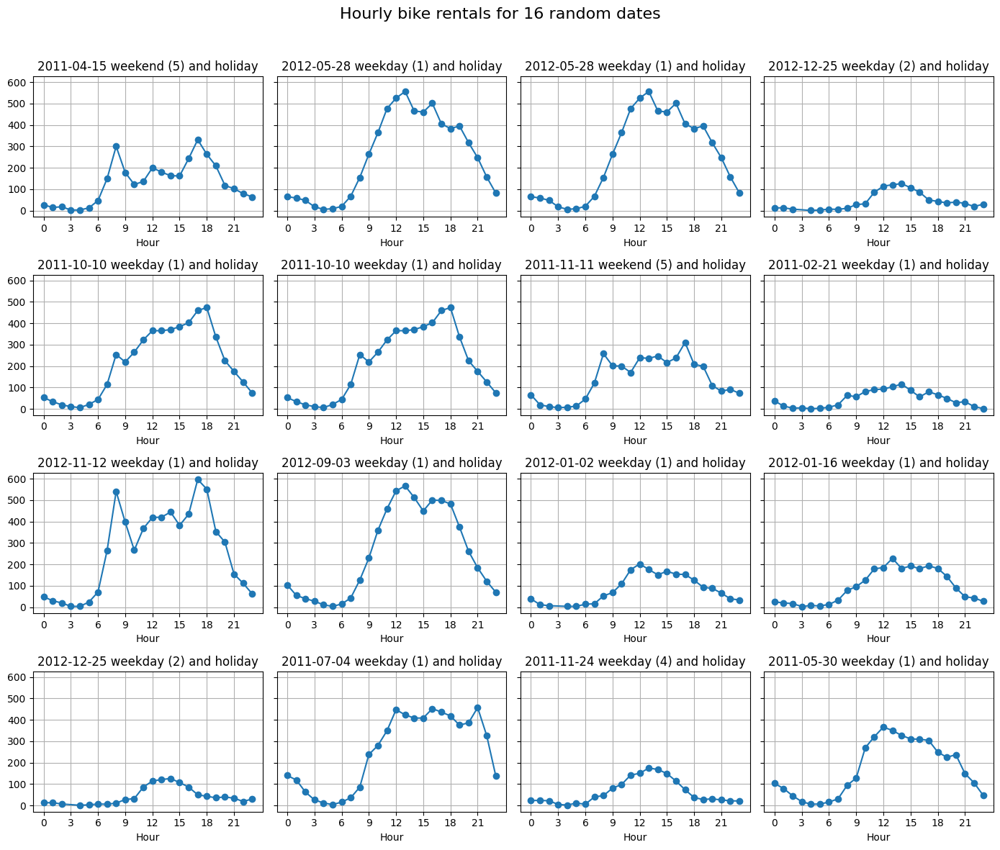

In [25]:
df_holidays = df_hour_data[df_hour_data['holiday'] == True]
plot_random_days(df_holidays)

Winter holidays seem to have a very low traffic except `2012-11-12`. `Fall` and `summer` holidays have quite a lot of traffic. Season definitily is one of the biggest indicators of bike renting numbers.

/tmp/ipykernel_597596/1384765348.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_seasonal = df.groupby(['season'])


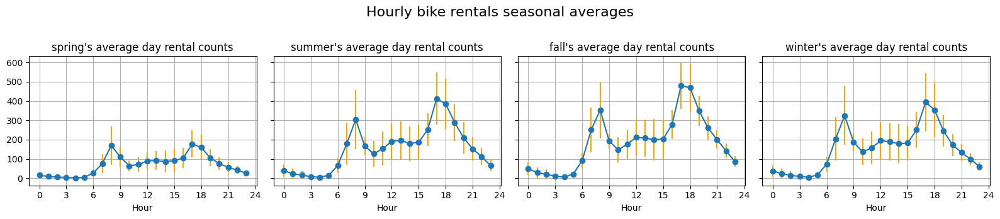

In [26]:
# Now on a more holistic and "on average" view apart from seasonal trends, how does weekends and weekdays differ? 
# Excluding holiday, and for each 4 season, let's plot the graph of what a typical day looks like for given season and plot the variance.
# year == 2011
df_hour_data_2011 = df_hour_data[df_hour_data['yr'] == 0]

# always assume non-holiday unless said explicitly
# df_weekdays_2011 = df_hour_data_2011[df_hour_data_2011['holiday'] == False && ][['dteday', 'hr', 'season', 'cnt']]
df_weekdays_2011 = df_hour_data_2011.query('holiday == False and weekday < 5')

def plot_seasonal_average(df):
# groupby the season and compute the average count for each hour.
    group_seasonal = df.groupby(['season'])

    fig, axes = plt.subplots(1, 4, figsize=(16, 3.5), sharey=True)
    axes = axes.flatten()

    num_to_season = {
        1:'spring', 2:'summer', 3:'fall', 4:'winter'
    }

    for ax, (season_num, group) in zip(axes, group_seasonal):
        season = num_to_season[season_num[0]]
        # for each group we want to average them by hours
        df_hour_means = group.groupby('hr').mean(numeric_only=True)
        df_hour_std = group.groupby('hr').std(numeric_only=True)
        ax.errorbar(df_hour_std.index, df_hour_means['cnt'], marker='o', yerr=df_hour_std['cnt'], linewidth=1.5, ecolor="orange")
        # ax.errorbar(, df_hour_std['cnt'], color="magenta")
        ax.set_title(f"{season}'s average day rental counts")
        ax.set_xlabel('Hour')
        ax.set_xticks(range(0, 25, 3))
        ax.grid(True)

    fig.suptitle('Hourly bike rentals seasonal averages', fontsize=16)
    fig.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

plot_seasonal_average(df_weekdays_2011)

/tmp/ipykernel_597596/1384765348.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_seasonal = df.groupby(['season'])


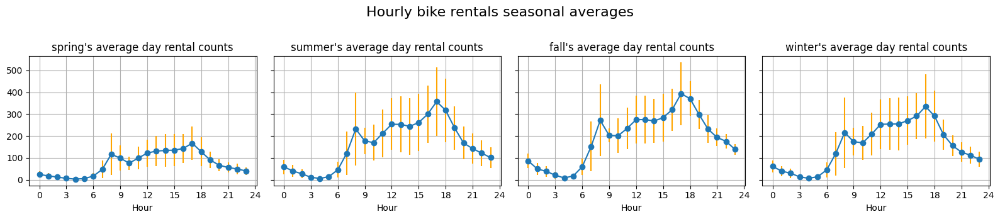

In [28]:
# year == 2011
df_weekends_2011 = df_hour_data_2011.query('holiday == False and weekday >= 5')
plot_seasonal_average(df_weekends_2011)

These `weekdays` and `weekends` distinction reveals that, aside from seasonal trends, `weekends` tend to be much more varied than `weekdays`. For seasonal trends, during `spring`, not much people uses bike rentals compared to other seasons. Also, due to work, `weekdays` tend to have much less traffic during work hours, namely from `10`am to `15`am. 